# Fatal Encounter Analysis of Major US Cities
## TEAM 15 - Hossein Khoshhal, Ying Zhou, Wei Yu
## Exploratory Data Analysis and Visualization with Python (90-800) - Fall 2023
### Datasets: US Fatal Enocunters Dataset (broken down into three csv's for Chicago, NYC, & LA), Simplemaps Zip Code Census, Chicago Community Area and Zip code Map

### Background: 
##### Fatal enounters are described as reported fatal incidents where police enforcement were present/involved. Incidents can include during pursuit, intentional/accidental fatal injury, self-harm, collateral damage, etc. 
##### For this project, we have decided to perform a study on the impacted areas of fatal encounters, mapping them, and looking to see if there are consistencies in their fatal encounter rate and their socioeconomic characteristics. For the sake of exploring data with more prevalent counts, we decided to look at 3 major cities in the US: Chicago, Los Angeles, and New York City. 

#### Methods:
##### We will first look at each city's communities that has been impacted by fatal encounters and map the locations affected by them by finding where the fatal encounter locations and community datasets match up. We will provide a choropleth map to show the range and frequency of fatal encounters in the most recent five years available of fatal encounters (2016-2021).
##### From there, we can get an understanding of their social and economic characteristics by referring each community with the simplemaps dataset (uszips).
##### For each city, we will compare the average home values, population percentage with a 4-year degree, and median household income. We will take the average of each city's top 5 most affected communities of fatal encounters, and compare them with their city's overall average. Furthermore, we'll also analyze unemployment rates, labor force participation, and median_rent in a heatmap to quantify the correlation.
##### Having done this for each city, we can gather what variables show noticeable disparities between the most affected areas and the city average. If there are any that can be seen, then there is a basis for correlation between fatal encounters and the variable in question. If not, then where these encounters take place are dismissive of those factors.
##### By looking at three cities, we can also see if any noticeable correlations are unique to a given city, or if there are trends of higher/lower averages among variables that could be consistent with different cities in the US.

Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')
from shapely.geometry import Point
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#### 1) Analyzing Chicago Data

Make a dataFrame (chicagodata) from fatal encounter data already filetered out to Chicago, IL

In [2]:
chicagodata = pd.read_csv('Chicago2016_2021.csv')
chicagodata.head(5)

,Name,Age,Gender,Race,Date of injury resulting in death (month/day/year),Location of death (city),State,Location of death (zip code),Location of death (county),Full Address,Latitude,Longitude,Agency or agencies involved,Highest level of force,Brief description,"Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS",Intended use of force (Developing)
0,Michael A. Craig,61.0,Male,African-American/Black,10/04/2021,Chicago,IL,60620,Cook,7700 block of South Carpenter Street Chicago I...,41.754079,-87.650486,Chicago Police Department,Gunshot,"Officers were called to a home by a ""male subj...",Pending investigation,Deadly force
1,Janelle Natashia Gardiner,37.0,Female,Hispanic/Latino,10/03/2021,Chicago,IL,60618,Cook,N Western Ave & W Irving Park Rd Chicago IL 60...,41.954079,-87.688531,Chicago Police Department,Vehicle,"Around 3 a.m., a Chicago police officer report...",Pending investigation,Pursuit
2,Devlin Romell Addison,32.0,Male,African-American/Black,10/01/2021,Chicago,IL,60651,Cook,Potomac Avenue and Mason Avenue Chicago IL 606...,41.903829,-87.774193,Chicago Police Department,Gunshot,"Around 10:30 a.m., Chicago police responded to...",Pending investigation,No
3,Turell Brown,28.0,Male,African-American/Black African-American/Black ...,09/19/2021,Chicago,IL,60621,Cook,6500 block South Harvard Ave Chicago IL 60621 ...,41.776369,-87.633640,Chicago Police Department,Gunshot,"At approximately 10:55 a.m., police said offic...",Pending investigation,Deadly force
4,Roberto Andino,51.0,Male,Hispanic/Latino,09/08/2021,Chicago,IL,60659,Cook,5952 N Lincoln Ave Chicago IL 60659 Cook,41.989209,-87.705946,Chicago Police Department,Gunshot,Roberto Andino allegedly killed his girlfriend...,Suicide,Suicide


Chicago Communities List Dataset: This is what we'll use to compare the latitudes and longitudes of fatal encounters with

In [3]:
import geopandas as gpd
community_data = gpd.read_file('Boundaries - Community Areas (current).geojson')
community_data.head()

,community,area,shape_area,perimeter,area_num_1,area_numbe,comarea_id,comarea,shape_len,geometry
0,DOUGLAS,0,46004621.1581,0,35,35,0,0,31027.0545098,"MULTIPOLYGON (((-87.60914 41.84469, -87.60915 ..."
1,OAKLAND,0,16913961.0408,0,36,36,0,0,19565.5061533,"MULTIPOLYGON (((-87.59215 41.81693, -87.59231 ..."
2,FULLER PARK,0,19916704.8692,0,37,37,0,0,25339.0897503,"MULTIPOLYGON (((-87.62880 41.80189, -87.62879 ..."
3,GRAND BOULEVARD,0,48492503.1554,0,38,38,0,0,28196.8371573,"MULTIPOLYGON (((-87.60671 41.81681, -87.60670 ..."
4,KENWOOD,0,29071741.9283,0,39,39,0,0,23325.1679062,"MULTIPOLYGON (((-87.59215 41.81693, -87.59215 ..."


Making GeoDataFrame of the data performing and doing a spatial join of the fatal encounter and community dataframes

In [4]:
# Create a GeoDataFrame for Chicago data
geometry_data_chicago = gpd.points_from_xy(chicagodata['Longitude'], chicagodata['Latitude'])
gdf_data_chicago = gpd.GeoDataFrame(chicagodata, geometry=geometry_data_chicago)
gdf_data_chicago = gdf_data_chicago.set_crs('EPSG:4326')

#spatial join
result_chicago = gpd.sjoin(gdf_data_chicago, community_data, how='left', predicate='within')

#add the community index to their corresponding enounter rows
chicagodata['community'] = result_chicago['index_right']
chicagodata

,Name,Age,Gender,Race,Date of injury resulting in death (month/day/year),Location of death (city),State,Location of death (zip code),Location of death (county),Full Address,Latitude,Longitude,Agency or agencies involved,Highest level of force,Brief description,"Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS",Intended use of force (Developing),community
0,Michael A. Craig,61.0,Male,African-American/Black,10/04/2021,Chicago,IL,60620,Cook,7700 block of South Carpenter Street Chicago I...,41.754079,-87.650486,Chicago Police Department,Gunshot,"Officers were called to a home by a ""male subj...",Pending investigation,Deadly force,69
1,Janelle Natashia Gardiner,37.0,Female,Hispanic/Latino,10/03/2021,Chicago,IL,60618,Cook,N Western Ave & W Irving Park Rd Chicago IL 60...,41.954079,-87.688531,Chicago Police Department,Vehicle,"Around 3 a.m., a Chicago police officer report...",Pending investigation,Pursuit,47
2,Devlin Romell Addison,32.0,Male,African-American/Black,10/01/2021,Chicago,IL,60651,Cook,Potomac Avenue and Mason Avenue Chicago IL 606...,41.903829,-87.774193,Chicago Police Department,Gunshot,"Around 10:30 a.m., Chicago police responded to...",Pending investigation,No,25
3,Turell Brown,28.0,Male,African-American/Black African-American/Black ...,09/19/2021,Chicago,IL,60621,Cook,6500 block South Harvard Ave Chicago IL 60621 ...,41.776369,-87.633640,Chicago Police Department,Gunshot,"At approximately 10:55 a.m., police said offic...",Pending investigation,Deadly force,65
4,Roberto Andino,51.0,Male,Hispanic/Latino,09/08/2021,Chicago,IL,60659,Cook,5952 N Lincoln Ave Chicago IL 60659 Cook,41.989209,-87.705946,Chicago Police Department,Gunshot,Roberto Andino allegedly killed his girlfriend...,Suicide,Suicide,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,Pierre Loury,16.0,Male,African-American/Black,04/11/2016,Chicago,IL,60624,Cook,3400 block West Grenshaw Street Chicago IL 606...,41.867443,-87.710942,Chicago Police Department,Gunshot,Officers on patrol were trying to pull over a ...,Pending investigation,Deadly force,29
94,Lamar Harris,29.0,Male,African-American/Black,03/14/2016,Chicago,IL,60624,Cook,3700 block West Polk Street Chicago IL 60624 Cook,41.871030,-87.718123,Chicago Police Department,Gunshot,"Officers were investigating ""possible narcotic...",Pending investigation,Deadly force,27
95,Dimitrius Baldwin,25.0,Male,Race unspecified,03/05/2016,Chicago,IL,60804,Cook,4100 block South Cicero Avenue Chicago IL 6080...,41.820582,-87.744214,Chicago Police Department,Drowned,Dimitrius Baldwin reportedly died after jumpin...,Unreported,No,54
96,Charles M. Smith,29.0,Male,African-American/Black,01/31/2016,Chicago,IL,60636,Cook,7305 South Paulina Street Chicago IL 60636 Cook,41.760978,-87.666147,Chicago Police Department,Gunshot,Police said they shot and killed a man who fir...,Pending investigation,Deadly force,64


Create a Choropleth of Chicago with the count of fatal encounters in all the affected communities:

In [5]:
community_data['count'] = chicagodata['community'].value_counts()

fig_chicago = px.choropleth_mapbox(community_data, 
                                   color=community_data['count'], 
                                   geojson=community_data.geometry, 
                                   locations=community_data.index,
                                   center={"lat": 41.881832, "lon": -87.623177}, #placeholder center that's in chicago, you can adjust with the map interface
                                   zoom=9,
                                   mapbox_style="carto-positron",
                                   color_continuous_scale="blues") # for consistency the visuals are color coded so chicago = blue

fig_chicago.update_layout(
    margin=dict(l=0, r=0, t=20, b=15),
    width=800,
    height=600,
    title="Chicago Fatal Encounters by Community",
    title_x=0.5
)

Find the five communities with the highest instances of fatal encounters:

In [6]:
community_data['count'] = chicagodata['community'].value_counts()
orders = chicagodata['community'].value_counts().sort_values(ascending=False).index
#find the ones with the highest counts, only show 5
most_dangerous_5 = [community_data['community'][i] for i in orders[:5].tolist()]
most_dangerous_5

['NORTH LAWNDALE', 'WEST ENGLEWOOD', 'AUSTIN', 'ROSELAND', 'NEAR WEST SIDE']

#### 2) Analyzing Los Angeles Data

Load communities data

In [7]:
la_communities = gpd.read_file('LA_Times_Neighborhood_Boundaries.geojson')
la_communities.head()

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."


In [8]:
#load fatal encounter data for LA
la_data = pd.read_csv("LA2016_2021.csv")
la_data.head()

,Unique ID,Name,Age,Gender,Race,Race with imputations,Date of injury resulting in death (month/day/year),Location of injury (address),Location of death (city),State,...,Latitude,Longitude,Agency or agencies involved,Highest level of force,Brief description,"Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS",Intended use of force (Developing),Supporting document link,"Foreknowledge of mental illness? INTERNAL USE, NOT FOR ANALYSIS",Unique identifier (redundant)
0,31455.0,Enrique Ruiz,33.0,Male,Race unspecified,NaN,12/26/2021,2900 block W Broadway,Los Angeles,CA,...,34.144907,-118.227677,Los Angeles Police Department,Gunshot,"Around 6 p.m., officers were called by firefig...",Pending investigation,Deadly force,https://mynewsla.com/crime/2021/12/30/man-shot...,No,31455.0
1,31443.0,Daniel Elena Lopez,24.0,Male,Hispanic/Latino,Hispanic/Latino,12/23/2021,12121 Victory Blvd,Los Angeles,CA,...,34.187594,-118.397506,Los Angeles Police Department,Gunshot,"Valentina Orellana-Peralta, 14, was killed whe...",Pending investigation,Deadly force,https://www.usatoday.com/story/news/nation/202...,No,31443.0
2,31448.0,Valentina Orellana-Peralta,14.0,Female,Hispanic/Latino,Hispanic/Latino,12/23/2021,12121 Victory Blvd,Los Angeles,CA,...,34.187594,-118.397506,Los Angeles Police Department,Gunshot,"Valentina Orellana-Peralta, 14, was killed whe...",Pending investigation,Deadly force,https://www.usatoday.com/story/news/nation/202...,No,31448.0
3,31422.0,Margarito Lopez,22.0,Male,Hispanic/Latino,Hispanic/Latino,12/18/2021,900 E. Adams Blvd,Los Angeles,CA,...,34.019586,-118.257370,Los Angeles Police Department,Gunshot,"Around 7 p.m., officers responded to a radio c...",Pending investigation,Deadly force,https://www.lapdonline.org/office-of-the-chief...,No,31422.0
4,31424.0,Rosendo Olivio,34.0,Male,Hispanic/Latino,Hispanic/Latino,12/18/2021,2200 block Wall St,Los Angeles,CA,...,34.026744,-118.261907,Los Angeles Police Department,Gunshot,Officers responded to a call of a man in his 3...,Pending investigation,Deadly force,https://www.nbclosangeles.com/news/local/coron...,No,31424.0


Create a gdf for LA and add community column to the dataFrame

In [9]:
geometry_data_la = gpd.points_from_xy(la_data['Longitude'], la_data['Latitude'])
gdf_data_la = gpd.GeoDataFrame(la_data, geometry=geometry_data_la)

#set CRS
gdf_data_la = gdf_data_la.set_crs('EPSG:4326')

#spatial join
result_la = gpd.sjoin(gdf_data_la, la_communities, how='left', predicate='within')

la_data['community'] = result_la['index_right']
la_data.head()

,Unique ID,Name,Age,Gender,Race,Race with imputations,Date of injury resulting in death (month/day/year),Location of injury (address),Location of death (city),State,...,Longitude,Agency or agencies involved,Highest level of force,Brief description,"Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS",Intended use of force (Developing),Supporting document link,"Foreknowledge of mental illness? INTERNAL USE, NOT FOR ANALYSIS",Unique identifier (redundant),community
0,31455.0,Enrique Ruiz,33.0,Male,Race unspecified,NaN,12/26/2021,2900 block W Broadway,Los Angeles,CA,...,-118.227677,Los Angeles Police Department,Gunshot,"Around 6 p.m., officers were called by firefig...",Pending investigation,Deadly force,https://mynewsla.com/crime/2021/12/30/man-shot...,No,31455.0,24.0
1,31443.0,Daniel Elena Lopez,24.0,Male,Hispanic/Latino,Hispanic/Latino,12/23/2021,12121 Victory Blvd,Los Angeles,CA,...,-118.397506,Los Angeles Police Department,Gunshot,"Valentina Orellana-Peralta, 14, was killed whe...",Pending investigation,Deadly force,https://www.usatoday.com/story/news/nation/202...,No,31443.0,66.0
2,31448.0,Valentina Orellana-Peralta,14.0,Female,Hispanic/Latino,Hispanic/Latino,12/23/2021,12121 Victory Blvd,Los Angeles,CA,...,-118.397506,Los Angeles Police Department,Gunshot,"Valentina Orellana-Peralta, 14, was killed whe...",Pending investigation,Deadly force,https://www.usatoday.com/story/news/nation/202...,No,31448.0,66.0
3,31422.0,Margarito Lopez,22.0,Male,Hispanic/Latino,Hispanic/Latino,12/18/2021,900 E. Adams Blvd,Los Angeles,CA,...,-118.257370,Los Angeles Police Department,Gunshot,"Around 7 p.m., officers responded to a radio c...",Pending investigation,Deadly force,https://www.lapdonline.org/office-of-the-chief...,No,31422.0,46.0
4,31424.0,Rosendo Olivio,34.0,Male,Hispanic/Latino,Hispanic/Latino,12/18/2021,2200 block Wall St,Los Angeles,CA,...,-118.261907,Los Angeles Police Department,Gunshot,Officers responded to a call of a man in his 3...,Pending investigation,Deadly force,https://www.nbclosangeles.com/news/local/coron...,No,31424.0,46.0


Create the choropleth for LA:

In [10]:
la_communities['count'] = la_data['community'].value_counts()
fig = px.choropleth_mapbox(la_communities, color=la_communities['count'], geojson=la_communities.geometry, locations=la_communities.index,
                           center={"lat": 34.098907, "lon": -118.327759}, zoom=9,
                           mapbox_style="carto-positron",
                           color_continuous_scale="greens")

fig.update_layout(
    margin=dict(l=0, r=0, t=25, b=20),
    width=800,
    height=600,
     title="Los Angeles Fatal Encounters by Community",
     title_x=0.5)

Notice in this map, there are much more concentrated communities where fatal encounters take place. The top five communities affected in LA are Downtown (10 encounters), Boyle Heights (9), Historic South-Central (7), Westlake (5), and Hollywood (4). Most of the other locations have 1-2 encounters. 

#### 3) Analyzing New York City Data

Load the community and fatal encounter dataFrames

In [11]:
ny_data = pd.read_csv("NY2016_2021.csv")
ny_data.head()

,Unique ID,Name,Age,Gender,Race,Race with imputations,Date of injury resulting in death (month/day/year),Location of injury (address),Location of death (city),State,...,Latitude,Longitude,Agency or agencies involved,Highest level of force,Brief description,"Dispositions/Exclusions INTERNAL USE, NOT FOR ANALYSIS",Intended use of force (Developing),Supporting document link,"Foreknowledge of mental illness? INTERNAL USE, NOT FOR ANALYSIS",Unique identifier (redundant)
0,31450.0,Carson Dobson,24.0,Male,Race unspecified,NaN,12/24/2021,203 Mers Way,Dolgeville,NY,...,43.100904,-74.772927,New York State Police,Gunshot,Troopers Andrew Gorinshek and Jennifer Greenwo...,Pending investigation,Deadly force,https://www.uticaod.com/story/news/2021/12/25/...,No,31450.0
1,31439.0,Mark Anthony Beilby Jr.,24.0,Male,European-American/White,European-American/White,12/22/2021,3 Lyons St,Unadilla,NY,...,42.327988,-75.314622,New York State Police,Gunshot,A trooper responded to a 911 call regarding a ...,Pending investigation,Deadly force,https://www.nytimes.com/2021/12/23/nyregion/ma...,No,31439.0
2,31427.0,Eudes Pierre,26.0,Male,African-American/Black,African-American/Black,12/20/2021,1090 Eastern Pkwy,Brooklyn,NY,...,40.668380,-73.932354,City of New York Police Department,Gunshot,"About 4:10 a.m., uniformed officers responded ...",Pending investigation,Deadly force,https://www.amny.com/news/suspect-killed-brook...,No,31427.0
3,31405.0,James Thigpen,36.0,Male,Race unspecified,NaN,12/19/2021,W. Water Street and Larchmont Road.,West Elmira,NY,...,42.078063,-76.852670,Chemung County Sheriff's Office,Vehicle,"At about 7:43 p.m., a deputy saw a 2018 Honda ...",Pending investigation,Pursuit,https://www.mytwintiers.com/news-cat/top-stori...,No,31405.0
4,31347.0,Name withheld by police,NaN,Male,Race unspecified,NaN,12/16/2021,56-15 Northern Blvd,Flushing,NY,...,40.753832,-73.904430,City of New York Police Department,Gunshot,An off-duty NYPD lieutenant was shot multiple ...,Pending investigation,Deadly force,https://pix11.com/news/local-news/queens/off-d...,No,31347.0


In this case for NYC, we decided to look at NYC districts to avoid covering too narrow of an area by zip code/community

In [12]:
ny_communities = gpd.read_file('Community Districts.geojson')
ny_communities.head()

,boro_cd,shape_area,shape_leng,geometry
0,308,45603787.0874,38232.8866494,"MULTIPOLYGON (((-73.95829 40.67983, -73.95596 ..."
1,414,195576601.145,210918.174933,"MULTIPOLYGON (((-73.90972 40.56529, -73.90973 ..."
2,204,55522139.9705,31358.4504633,"MULTIPOLYGON (((-73.90269 40.84458, -73.90271 ..."
3,501,377232535.794,153751.224769,"MULTIPOLYGON (((-74.15946 40.64145, -74.15975 ..."
4,407,328287557.576,145357.138028,"MULTIPOLYGON (((-73.85255 40.76007, -73.85224 ..."


Create GeodataFrame for NYC

In [13]:
geometry_data_ny = gpd.points_from_xy(ny_data['Longitude'], ny_data['Latitude'])
gdf_data_ny = gpd.GeoDataFrame(ny_data, geometry=geometry_data_ny)

#setting crs to prevent userwarning
gdf_data_ny = gdf_data_ny.set_crs('EPSG:4326')

#spatial join
result_ny = gpd.sjoin(gdf_data_ny, ny_communities, how='left', predicate='within')
ny_data['community'] = result_ny['index_right']


Choropleth map for NYC

In [14]:
ny_communities['count'] = ny_data['community'].value_counts()

fig_ny = px.choropleth_mapbox(ny_communities, 
                              color=ny_communities['count'], 
                              geojson=ny_communities.geometry, 
                              locations=ny_communities.index,
                              center={"lat": 40.7128, "lon": -74.0060},  # Center for New York
                              zoom=9,
                              mapbox_style="carto-positron",
                              color_continuous_scale="reds")

fig_ny.update_layout(
    margin=dict(l=0, r=0, t=25, b=20),
    width=800,
    height=600,
    title="New York Fatal Encounters by Community",
    title_x=0.5
)

fig_ny.show()

You'll notice in this one, the areas affected are more dispersed and have more areas with >2 encounters, but the most affected communities in the last 5 years range from 3-5 fatal encounters. The most affected districts are Bronx 12 (5), Queens 2 (4), Brooklyn 16 (4), Queens (12), Bronx 5 (5).

### II. Analyzing Demographic Information using simplemaps dataset

Load simplemaps dataset

In [15]:
demo_data = pd.read_csv('uszips.csv')
demo_data.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,...,education_college_or_above,labor_force_participation,unemployment_rate,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple
0,501,40.81308,-73.04639,Holtsville,NY,New York,False,11742.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,544,40.81322,-73.04929,Holtsville,NY,New York,False,11742.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,601,18.18027,-66.75266,Adjuntas,PR,Puerto Rico,True,NaN,17126.0,102.6,...,14.6,39.0,25.1,84.5,1.4,0.0,0.1,0.0,8.9,5.2
3,602,18.36075,-67.17541,Aguada,PR,Puerto Rico,True,NaN,37895.0,482.5,...,21.9,37.8,7.7,61.3,1.8,0.1,0.1,0.0,3.9,32.7
4,603,18.45744,-67.12225,Aguadilla,PR,Puerto Rico,True,NaN,49136.0,552.4,...,24.3,38.2,17.2,74.3,3.4,0.1,0.1,0.0,14.5,7.6


Chicago's Top 5 communities with fatal encounters compared to the overall city average

In [16]:
demo_ch = demo_data[demo_data['city']=='Chicago']
demo_ch.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,...,education_college_or_above,labor_force_participation,unemployment_rate,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple
26057,60601,41.88527,-87.62197,Chicago,IL,Illinois,True,NaN,14804.0,14706.9,...,88.1,74.0,3.4,58.7,7.0,26.1,0.1,0.0,3.6,4.6
26058,60602,41.88304,-87.62906,Chicago,IL,Illinois,True,NaN,1142.0,5350.7,...,82.2,91.8,0.0,54.6,3.3,8.8,33.3,0.0,0.0,0.0
26059,60603,41.88018,-87.62740,Chicago,IL,Illinois,True,NaN,1275.0,4149.5,...,93.2,66.1,5.2,59.3,5.6,31.1,0.0,0.0,1.9,2.1
26060,60604,41.87799,-87.62928,Chicago,IL,Illinois,True,NaN,687.0,3434.4,...,93.5,65.5,20.6,77.3,10.5,10.2,0.0,0.0,0.3,1.7
26061,60605,41.86644,-87.61956,Chicago,IL,Illinois,True,NaN,32077.0,8658.3,...,78.1,73.5,6.8,62.8,14.4,15.4,0.2,0.0,2.0,5.3


In [17]:
#all zip codes within the top 5 affected communities
selected_zips = [60608, 60623, 60624, 60632, 60636, 60644, 60639, 60651, 60619, 60620, 60628, 60607, 60612, 60661]

top_communities_chicago = demo_data.loc[demo_data['zip'].isin(selected_zips), 
                                       ['zip', 'population', 'education_college_or_above', 'income_household_median', 'home_value']]
top_communities_chicago

,zip,population,education_college_or_above,income_household_median,home_value
26063,60607,29990.0,78.9,109634.0,447257.0
26064,60608,83689.0,30.4,61490.0,289255.0
26068,60612,33908.0,39.5,52126.0,297092.0
26075,60619,63481.0,27.1,43329.0,171970.0
26076,60620,69357.0,17.8,40117.0,150119.0
26079,60623,77352.0,12.8,35890.0,172329.0
26080,60624,36986.0,11.1,29102.0,185119.0
26083,60628,64489.0,21.9,46665.0,127216.0
26087,60632,87395.0,12.5,48791.0,202831.0
26090,60636,30412.0,10.0,27831.0,106709.0


Now lets compare the education level, household income, and home value of the 5 most affected areas and average

In [18]:
top_communities_chicago.describe()

,zip,population,education_college_or_above,income_household_median,home_value
count,14.000000,14.000000,14.000000,14.000000,14.000000
mean,60628.857143,56388.357143,28.192857,54542.857143,228596.428571
std,16.047320,24726.140371,25.698053,31609.006937,96982.479204
min,60607.000000,11073.000000,10.000000,27831.000000,106709.000000
25%,60619.250000,34677.500000,12.575000,36946.750000,172059.750000
50%,60626.000000,63985.000000,16.400000,45607.000000,201928.500000
75%,60638.250000,75353.250000,29.575000,52929.250000,280276.500000
max,60661.000000,89037.000000,91.400000,139063.000000,447257.000000


In [19]:
demo_ch = demo_ch[['city', 'zip', 'population', 'education_college_or_above', 'income_household_median', 'home_value', 'rent_median', 'labor_force_participation', 'unemployment_rate']] #overall city average chicago
demo_ch.describe()

,zip,population,education_college_or_above,income_household_median,home_value,rent_median,labor_force_participation,unemployment_rate
count,84.000000,56.000000,56.000000,56.000000,54.000000,56.000000,56.000000,56.000000
mean,60647.678571,48671.142857,47.157143,76232.660714,312873.111111,1371.250000,68.201786,8.900000
std,29.808692,25866.472673,27.692643,38463.044909,136428.319205,460.030641,9.862611,6.040981
min,60601.000000,687.000000,10.000000,24912.000000,103207.000000,809.000000,48.700000,0.000000
25%,60621.750000,30306.500000,21.550000,46553.000000,201477.250000,1053.000000,61.700000,4.350000
50%,60644.500000,48779.000000,44.550000,69352.000000,290915.500000,1188.000000,66.150000,6.400000
75%,60674.250000,68291.250000,75.850000,103669.250000,406128.500000,1696.750000,73.600000,12.275000
max,60701.000000,107487.000000,93.500000,235666.000000,663258.000000,2340.000000,93.200000,23.900000


You'll notice in all three categories, the affected areas fall below the city average

Create a bar plot to visualize the disparities/lack thereof

In [20]:

#for the variables we want, we'll get the means of the top five communities
mean_values_top = top_communities_chicago.mean()
mean_values_demo = demo_ch[['income_household_median', 'education_college_or_above', 'home_value']].mean()

#create a plot with three subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=['Household Income', '% 4-Year Degree', 'Home Value'],
                    vertical_spacing=0.1)  # Adjust the vertical spacing as needed

#subplots as bar plots, affected communities average next to overall average
fig.add_trace(go.Bar(y=[mean_values_top['income_household_median']], name='Average of Top 5 Affected Communities',
                     marker_color='#004c70', legendgroup='top_communities'), row=1, col=1)
fig.add_trace(go.Bar(y=[mean_values_demo['income_household_median']], name='Overall Chicago Average',
                     showlegend=True, marker_color='#aec7e8', legendgroup='overall_average'), row=1, col=1)

fig.add_trace(go.Bar(y=[mean_values_top['education_college_or_above']], name='Top Communities',
                     marker_color='#004c70', showlegend=False), row=1, col=2)
fig.add_trace(go.Bar(y=[mean_values_demo['education_college_or_above']], name='Overall Chicago Average',
                     showlegend=False, marker_color='#aec7e8'), row=1, col=2)

fig.add_trace(go.Bar(y=[mean_values_top['home_value']], name='Top Communities',
                     marker_color='#004c70', showlegend=False,), row=1, col=3)
fig.add_trace(go.Bar(y=[mean_values_demo['home_value']], name='Overall Chicago Average',
                     showlegend=False, marker_color='#aec7e8'), row=1, col=3)

fig.update_layout(title_text='Chicago Most Affected Encounter Communities vs Chicago Average',
                  showlegend=True,
                  legend=dict(x=1, y=0.5, itemsizing='constant'),
                  width=800, 
                  height=300,
                  xaxis=dict(tickvals=[], title=None),
                  margin=dict(l=50, r=50, t=60, b=50))

fig.show()


A significant educational disparity exists between affected and non-affected areas, with the percentage of the population having received a college-level education in the affected areas being 19% lower than the city average. Notably, the most dangerous zone, North Lawndale, exhibits an even more pronounced educational gap, with only 18.1% of the community population having attained a 4-year college level education.


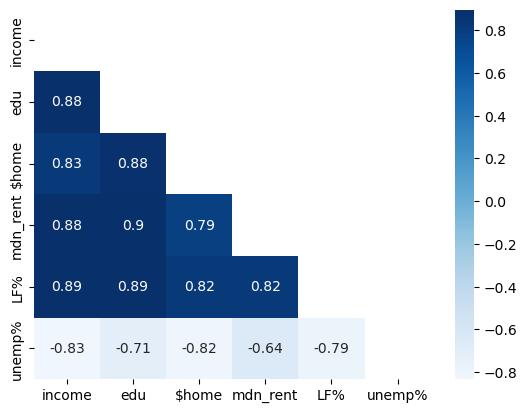

In [31]:
#Getting all the unique zipcodes for affected areas from the fatal encounter csv for chicago
unique_zipcodes_ch = chicagodata['Location of death (zip code)'].unique()
unique_zipcodes_ch

#Generate the correlations among variables for only the affected areas
chicago_subset = demo_ch[demo_ch['zip'].isin(unique_zipcodes_ch)][['income_household_median', 'education_college_or_above', 'home_value', 'rent_median', 'labor_force_participation', 'unemployment_rate']]
column_names = {'income_household_median': 'income',
       'education_college_or_above': 'edu',
       'home_value': '$home',
       'rent_median': 'mdn_rent',
       'labor_force_participation': 'LF%',
       'unemployment_rate': 'unemp%'}
chicago_subset = chicago_subset.rename(columns=column_names)
correlation_matrix = chicago_subset.corr()
correlation_matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Blues", center=0)
plt.show()

##### LA's Top 5 communities with fatal encounters compared to the overall city average

,zip,income_household_median,education_college_or_above,home_value
37311,90011,47126.0,6.9,452130.0
37312,90012,53278.0,35.5,633598.0
37313,90013,22291.0,37.0,675213.0
37327,90027,78356.0,57.0,1321541.0
37328,90028,52814.0,51.3,720732.0


In [22]:
demola_data = pd.read_csv('uszips.csv')
demola_data = demo_data[demo_data['city']=='Los Angeles']
demola_data.describe()

,zip,lat,lng,parent_zcta,population,density,county_fips,age_median,male,female,...,education_college_or_above,labor_force_participation,unemployment_rate,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple
count,94.000000,94.000000,94.000000,28.000000,66.000000,66.000000,94.0,63.000000,63.000000,63.000000,...,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000,63.000000
mean,90049.446809,34.041723,-118.298386,90037.964286,36667.712121,5306.337879,6037.0,36.538095,50.412698,49.587302,...,36.344444,63.953968,8.784127,41.895238,12.455556,12.717460,1.155556,0.150794,22.773016,8.847619
std,32.095160,0.049597,0.077232,49.668890,23529.733556,3898.203290,0.0,7.300142,5.848145,5.848145,...,22.271961,9.991203,6.274094,19.617376,15.552230,12.017105,1.015331,0.250079,16.240116,2.835879
min,90001.000000,33.920370,-118.489760,90005.000000,0.000000,0.000000,6037.0,19.300000,40.600000,15.700000,...,0.000000,25.500000,0.000000,10.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90024.250000,34.004348,-118.341785,90012.000000,21902.250000,3072.100000,6037.0,32.650000,47.800000,49.100000,...,16.000000,61.000000,6.500000,28.850000,2.550000,2.100000,0.400000,0.000000,7.000000,6.950000
50%,90047.500000,34.052485,-118.286535,90018.500000,38328.500000,4702.950000,6037.0,35.600000,49.800000,50.200000,...,35.500000,64.700000,7.900000,34.600000,6.100000,11.700000,0.900000,0.100000,21.800000,9.400000
75%,90071.750000,34.069295,-118.244052,90042.750000,51193.750000,6915.550000,6037.0,39.300000,50.900000,52.200000,...,55.700000,70.350000,9.350000,55.200000,17.050000,18.700000,1.650000,0.200000,35.150000,10.850000
max,90189.000000,34.137490,-118.148900,90210.000000,109511.000000,20886.700000,6037.0,62.500000,84.300000,59.400000,...,80.700000,78.200000,49.500000,100.000000,66.900000,62.000000,4.800000,1.500000,62.200000,14.100000


In [36]:
la_zips = [
    90012, 90013,  # Downtown
    90033, 90063,  # Boyle Heights
    90011,  # Historic South-Central
    90057,  # Westlake
    90027, 90028, 90038, 90046, 90068, 90069  # Hollywood
]
#most affected communities zip codes

la_data = demola_data[demola_data['zip'].isin(la_zips)][['zip', 'income_household_median', 'education_college_or_above', 'home_value']]
mean_values_la = la_data.mean()
mean_values_demo_la = demola_data[['income_household_median', 'education_college_or_above', 'home_value']].mean()


fig = make_subplots(rows=1, cols=3, subplot_titles=['Household Income', '% 4-Year Degree', 'Home Value'], vertical_spacing=0.1)

#color palette for bars
dark_green = '#006400'
milder_green = '#00cc00'

#same as chicago, making the 
fig.add_trace(go.Bar(y=[mean_values_la['income_household_median']], name='LA ZIP Codes', **bar_settings_la, text=[format_hover_text(mean_values_la['income_household_median'])]), row=1, col=1)
fig.add_trace(go.Bar(y=[mean_values_demo_la['income_household_median']], name='Overall LA Average', **bar_settings_demo_la, text=[format_hover_text(mean_values_demo_la['income_household_median'])]), row=1, col=1)

fig.add_trace(go.Bar(y=[mean_values_la['education_college_or_above']], name='LA ZIP Codes', **bar_settings_la, text=[format_hover_text(mean_values_la['education_college_or_above'])]), row=1, col=2)
fig.add_trace(go.Bar(y=[mean_values_demo_la['education_college_or_above']], name='Overall LA Average', **bar_settings_demo_la, text=[format_hover_text(mean_values_demo_la['education_college_or_above'])]), row=1, col=2)

fig.add_trace(go.Bar(y=[mean_values_la['home_value']], name='LA ZIP Codes', **bar_settings_la, text=[format_hover_text(mean_values_la['home_value'])]), row=1, col=3)
fig.add_trace(go.Bar(y=[mean_values_demo_la['home_value']], name='Overall LA Average', **bar_settings_demo_la, text=[format_hover_text(mean_values_demo_la['home_value'])]), row=1, col=3)

fig.update_layout(title_text='Comparison of Mean Values between LA ZIP Codes and Overall LA Average', width=800, height=300, xaxis=dict(tickvals=[], title=None), margin=dict(l=50, r=50, t=60, b=50))

fig.show()


One last analysis: Triangle map including Labor Force Participation, Unemployment rate, and Median Rent.

In [38]:
unique_zipcodes_la = la_data['Location of death (zip code)'].unique()
unique_zipcodes_la
la_subset = demola_data[demola_data['zip'].isin(unique_zipcodes_la)][['income_household_median', 'education_college_or_above', 'home_value', 'rent_median', 'labor_force_participation', 'unemployment_rate']]

column_names = {'income_household_median': 'income',
       'education_college_or_above': 'edu',
       'home_value': '$home',
       'rent_median': 'mdn_rent',
       'labor_force_participation': 'LF%',
       'unemployment_rate': 'unemp%'}
la_subset = la_subset.rename(columns=column_names)
correlation_matrix = la_subset.corr()

correlation_matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Greens", center=0)
plt.show()

KeyError: 'Location of death (zip code)'

NYC Analysis

Filter out NYC in simplemaps dataset

In [28]:
demonyc_data = pd.read_csv('uszips.csv')
#to filter out NYC locations, we have to combine the 5 NY counties since cities don't show up as 'New york' like it did with the others.
counties = ['Queens', 'Kings', 'Richmond', 'New York', 'Bronx']
demonyc_data = demonyc_data[demonyc_data['county_name'].isin(counties)]

demonyc_data.head()

,zip,lat,lng,city,state_id,state_name,zcta,parent_zcta,population,density,...,education_college_or_above,labor_force_participation,unemployment_rate,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple
3588,10001,40.75064,-73.99728,New York,NY,New York,True,NaN,26966.0,16690.1,...,73.2,74.1,4.1,62.9,7.9,16.8,0.1,0.2,4.0,8.1
3589,10002,40.71597,-73.98692,New York,NY,New York,True,NaN,76807.0,36064.2,...,36.4,54.0,7.5,32.1,8.4,39.4,0.8,0.0,11.5,7.7
3590,10003,40.73184,-73.98915,New York,NY,New York,True,NaN,54447.0,36777.5,...,82.3,67.4,5.1,70.7,5.2,16.7,0.3,0.1,1.6,5.4
3591,10004,40.69431,-74.01835,New York,NY,New York,True,NaN,4795.0,4063.8,...,96.6,85.7,1.6,57.5,3.4,33.2,0.0,0.0,0.4,5.5
3592,10005,40.70614,-74.00862,New York,NY,New York,True,NaN,8637.0,45764.5,...,92.7,94.4,3.2,75.2,1.7,13.7,0.0,0.0,3.2,6.2


In [29]:
nyc_zips = [
    10460, 10466, 10467, 10469, 10470, 10475,  # Bronx 12
    11101, 11104, 11377, 11378,  # Queens 2
    11212, 11233,  # Brooklyn 16
    11412, 11423, 11433, 11434, 11435, 11436,  # Queens 12
    10452, 10453, 10457, 10458, 10468  # Bronx 5
]

#nyc_data will include the zip codes of listed
nyc_data = demonyc_data[demonyc_data['zip'].isin(nyc_zips)][['zip', 'income_household_median', 'education_college_or_above', 'home_value']]

#mean values for each variable
mean_values_nyc = nyc_data.groupby('zip').mean().mean()  # Calculate the mean for each ZIP code, then calculate the mean of those means
mean_values_demo_nyc = demonyc_data[['income_household_median', 'education_college_or_above', 'home_value']].mean()

fig = make_subplots(rows=1, cols=3, subplot_titles=['Household Income', '% 4-Year Degree', 'Home Value'],
                    vertical_spacing=0.15)  # Adjust the vertical spacing as needed



#subplots for the barplot
#median income
fig.add_trace(
    go.Bar(
        y=[mean_values_nyc['income_household_median']],
        name='Average of NYC ZIP Codes',
        marker_color='#FFA500',
        showlegend=False,
        text=[format_hover_text(mean_values_nyc['income_household_median'])]
    ),
    row=1, col=1
) 
fig.add_trace(
    go.Bar(
        y=[mean_values_demo_nyc['income_household_median']],
        name='Overall NYC Average',
        showlegend=False,
        marker_color='#FAC898',
        text=[format_hover_text(mean_values_demo_nyc['income_household_median'])]
    ),
    row=1, col=1
)  

#education level 
fig.add_trace(
    go.Bar(
        y=[mean_values_nyc['education_college_or_above']],
        name='Average of NYC ZIP Codes',
        marker_color='#FFA500',
        showlegend=False,
        text=[format_hover_text(mean_values_nyc['education_college_or_above'])]
    ),
    row=1, col=2
) 
fig.add_trace(
    go.Bar(
        y=[mean_values_demo_nyc['education_college_or_above']],
        name='Overall NYC Average',
        showlegend=False,
        marker_color='#FAC898',
        text=[format_hover_text(mean_values_demo_nyc['education_college_or_above'])]
    ),
    row=1, col=2
)

#home value subplot
fig.add_trace(
    go.Bar(
        y=[mean_values_nyc['home_value']],
        name='Average of NYC ZIP Codes',
        marker_color='#FFA500',
        showlegend=False,
        text=[format_hover_text(mean_values_nyc['home_value'])]
    ),
    row=1, col=3
)
fig.add_trace(
    go.Bar(
        y=[mean_values_demo_nyc['home_value']],
        name='Overall NYC Average',
        showlegend=False,
        marker_color='#FAC898',
        text=[format_hover_text(mean_values_demo_nyc['home_value'])]
    ),
    row=1, col=3
) 


fig.update_layout(
    title_text='NYC Most Affected Encounter Communities vs NYC Average',
    showlegend=False,
    width=800,  
    height=300,
    xaxis=dict(tickvals=[], title=None),
    margin=dict(l=50, r=50, t=60, b=50)
)


fig.show()

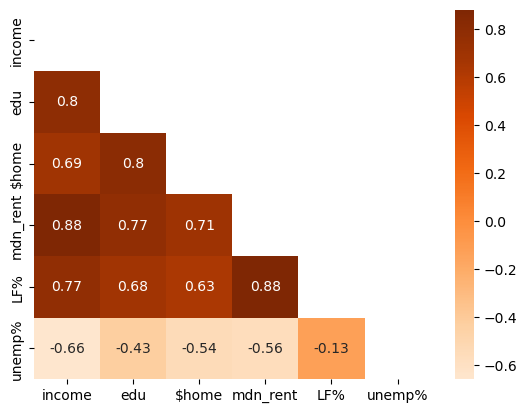

In [30]:

#Getting all the unique zipcodes for affected areas from the fatal encounter csv for NYC
unique_zipcodes_nyc = ny_data['Location of death (zip code)'].unique()
unique_zipcodes_nyc

#Generate the correlations among variables for only the affected areas
nyc_subset = demonyc_data[demonyc_data['zip'].isin(unique_zipcodes_nyc)][['income_household_median', 'education_college_or_above', 'home_value', 'rent_median', 'labor_force_participation', 'unemployment_rate']]
column_names = {'income_household_median': 'income',
       'education_college_or_above': 'edu',
       'home_value': '$home',
       'rent_median': 'mdn_rent',
       'labor_force_participation': 'LF%',
       'unemployment_rate': 'unemp%'}
nyc_subset = nyc_subset.rename(columns=column_names)
correlation_matrix = nyc_subset.corr()
correlation_matrix
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap="Oranges", center=0)
plt.show()

#### References
“Boundaries - Community Areas (Current): City of Chicago: Data Portal.” Chicago, data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-Community-Areas-current-/cauq-8yn6. Accessed 7 Dec. 2023.

“City of Los Angeles Hub.” City of Los Angeles Hub, geohub.lacity.org/datasets/d6c55385a0e749519f238b77135eafac/explore. Accessed 7 Dec. 2023.

“Community Districts.” NYC Open Data, data.cityofnewyork.us/City-Government/Community-Districts/yfnk-k7r4. Accessed 7 Dec. 2023.

D. Brian. Fatal Encounters, fatalencounters.org/view/person/. Accessed 7 Dec. 2023.
“Simplemaps Interactive Maps and Data.” Simplemaps, Pareto Software, LLC., simplemaps.com/. Accessed 7 Dec. 2023. 
